# Libraries

In [1]:
#Basic libraries
import pandas as pd
import numpy as np
import datetime as dt
import random

#Visualizations
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px

#Missing Values
from sklearn.impute import SimpleImputer
from scipy.stats import ks_2samp

#Outliers
from sklearn.ensemble import IsolationForest

#Multicolinealidad
from varclushi import VarClusHi

#Scaling
from sklearn.preprocessing import StandardScaler

#Dimensional Scaling (if necessary)
from sklearn.decomposition import PCA

#Clustering
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import calinski_harabasz_score
from scipy.cluster.hierarchy import linkage,cophenet,dendrogram
from scipy.spatial.distance import pdist


#Settings
#pd.options.display.float_format = '{:.5f}'.format  -> We remove scientific notion for floats w/5 decimals
pd.set_option("display.max_columns", 500)
pd.set_option("display.max_rows", 500)
%matplotlib inline
style.use("ggplot")
plt.rcParams["figure.figsize"] = (8,6)

# Functions

In [2]:
# Requencies
def freq(df, var):
    if type(var) != list:
        var = [var]
    
    for v in var:
        aux = df[v].value_counts().to_frame().rename(columns={v:'FA'})
        aux['FR'] = aux['FA'] / aux['FA'].sum()
        aux[['FAA','FRA']] = aux.apply( np.cumsum )
        print(f"Frequencies table for variable {v} \n")    
        print(aux,"\n")

In [3]:
#Normalize
def normalize(df, v, umbral):
    aux = df[v].value_counts(True).to_frame()
    aux[f'v_{v}'] = np.where( aux[v] < umbral , 'SMALL_CATEGORIES', aux.index   )
    moda = aux.head(1)[f'v_{v}'].values[0]
    if aux.loc[aux[f'v_{v}'] == 'SMALL_CATEGORIES'][v].sum() < umbral: 
        aux[f'v_{v}'].replace({'SMALL_CATEGORIES':moda},inplace=True)

    aux.drop(v,axis=1, inplace=True)
    aux.reset_index(inplace=True)

    return df.merge(aux, left_on=[v], right_on='index',how='inner').drop('index',axis=1)

In [4]:
def var_rename(df, v):
    
    df[f'c_{v}'] = df[v].copy()
    df.drop(columns=v, inplace =True)
    
    return df

In [5]:
def height(x):
    # format: 7' 0"
    foot = float(x.split("'")[0])
    inch = float(x.split("'")[-1])
    return (30.48*foot) + (2.54*inch)

In [6]:
def score_silueta(X,min_compo,max_compo):
    silueta = []
    for k in range(min_compo, max_compo):
        km = KMeans(n_clusters=k)
        km.fit(X)
        score = silhouette_score(X, km.labels_, metric='euclidean')
        silueta.append(score)

    df_silueta=pd.DataFrame()
    df_silueta["N_Clusters"]=range(min_compo,max_compo)
    df_silueta["score"]=silueta
    fig = px.line(df_silueta, x="N_Clusters", y="score", title="Optimum number of Clusters - Silueta") 
    return fig.show()

In [7]:
def elbow(X,min_compo,max_compo):
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(min_compo,max_compo)).fit(X)
    return visualizer.show()

In [8]:
def score_calinski(X,min_compo,max_compo):
    calinski = []
    for k in list(range(min_compo, max_compo)):
        km = KMeans(n_clusters=k)
        #km.fit(X_std)
        labels = km.fit_predict(X)
        score = calinski_harabasz_score(X,labels)
        calinski.append(score)
    df_calinski=pd.DataFrame()
    df_calinski["N_Clusters"]=range(min_compo,max_compo)
    df_calinski["score"]=calinski
    fig = px.line(df_calinski, x="N_Clusters", y="score", title="Optimum number of Cluster - Calinski") 
    return fig.show()

# Data

In [9]:
df = pd.read_csv("./data_fifa.csv")
df.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,Yes,RF,10.0,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,Yes,ST,7.0,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,Yes,LW,10.0,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,Yes,GK,1.0,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,Yes,RCM,7.0,"Aug 30, 2015",NaN,2023,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


## Cleaning / Pre-treatment

In [10]:
#We don't have any dupplicity on the players
df.shape[0], len(df["ID"].unique())

(18207, 18207)

In [11]:
#Useless column, we drop it immediately
df["Unnamed: 0"].value_counts(True)

0        0.000055
12136    0.000055
12142    0.000055
12141    0.000055
12140    0.000055
           ...   
6075     0.000055
6076     0.000055
6077     0.000055
6078     0.000055
18206    0.000055
Name: Unnamed: 0, Length: 18207, dtype: float64

### Performance Variables

In [12]:
#We define the performance variables
performance = df.iloc[:, 28:54].columns.tolist()

In [13]:
#We define the goalkeepers performance with 0 on all other positions
for col in performance:
    df[col].fillna("0", inplace = True)

In [14]:
#We leave just the performance section on the desire vairables
for col in performance:
    df[col] = df[col].map(lambda x: x.split("+")[0]).astype(int)

### Loaned Players

In [21]:
"""

93% of the players are not being loaned, we fill that information

"""
miss = (1 - df.count() / len(df)) *100
miss

Unnamed: 0                   0.000000
ID                           0.000000
Name                         0.000000
Age                          0.000000
Photo                        0.000000
Nationality                  0.000000
Flag                         0.000000
Overall                      0.000000
Potential                    0.000000
Club                         1.323667
Club Logo                    0.000000
Value                        0.000000
Wage                         0.000000
Special                      0.000000
Preferred Foot               0.263635
International Reputation     0.263635
Weak Foot                    0.263635
Skill Moves                  0.263635
Work Rate                    0.263635
Body Type                    0.263635
Real Face                    0.263635
Position                     0.329544
Jersey Number                0.329544
Joined                       8.529686
Loaned From                 93.057615
Contract Valid Until         1.587302
Height      

In [22]:
#We can make this a boolean variable so we have better information and not for it becoming a unary variable
df["Loaned From"].fillna("None", inplace=True)

In [23]:
df["Loaned"] = df["Loaned From"] != "None"
df["Loaned"] = df["Loaned"].astype(str)
df["Loaned"] = df["Loaned"].map(lambda x: x.replace("False", "0").replace("True", "1")).astype(int)

df.drop(columns=["Loaned From"], axis = 1, inplace = True)

### Cash Strins into Floats

In [24]:
cash = ["Value", "Wage", "Release Clause"]

In [25]:
#Release Clause has na value, we're replacing them for 0's
for col in cash:
    print("---------------------------")
    print(df[col].value_counts())

---------------------------
€1.1M      431
€375K      372
€425K      354
€325K      351
€450K      343
€525K      338
€350K      325
€1.2M      324
€400K      323
€1M        318
€475K      296
€500K      294
€600K      293
€550K      285
€675K      270
€575K      261
€1.3M      260
€0         252
€725K      241
€300K      240
€625K      238
€650K      225
€1.4M      221
€750K      219
€160K      206
€700K      203
€180K      202
€130K      201
€140K      200
€825K      197
€120K      193
€900K      190
€1.8M      188
€5.5M      187
€850K      186
€775K      184
€100K      178
€200K      177
€875K      174
€110K      174
€150K      174
€6.5M      169
€7M        169
€170K      168
€220K      166
€950K      162
€6M        160
€800K      160
€270K      157
€250K      156
€1.6M      154
€2.4M      151
€60K       150
€260K      149
€190K      144
€925K      144
€230K      141
€210K      140
€70K       139
€240K      139
€90K       136
€975K      134
€8M        133
€290K      130
€1.5M      1

In [26]:
df[cash] = df[cash].astype(str)

df["Release Clause"] = df["Release Clause"].map(lambda x: x.replace("an", "0"))

In [27]:
df[cash] = df[cash].astype(str)
for i in cash:
    df[i] = df[i].str[1:]
    df[i] = df[i].map(lambda x: float(x.strip("M")) * 1000000 if x[-1] == "M" else float(x.strip("K"))*1000)

In [28]:
df[cash]

,Value,Wage,Release Clause
0,110500000.0,565000.0,226500000.0
1,77000000.0,405000.0,127100000.0
2,118500000.0,290000.0,228100000.0
3,72000000.0,260000.0,138600000.0
4,102000000.0,355000.0,196400000.0
...,...,...,...
18202,60000.0,1000.0,143000.0
18203,60000.0,1000.0,113000.0
18204,60000.0,1000.0,165000.0
18205,60000.0,1000.0,143000.0


### Height and weight conversion into International values

In [29]:
#For Height, we're gonna use foots = 30.48 and inch = 2.54cm
df["Height"] = df["Height"].astype(str)

df["Height"] = df["Height"].apply(lambda x: height(x))

In [30]:
#For lbs we're using 1lbs = 0.454 kg

df["Weight"] = df["Weight"].str[:-3]
df["Weight"] = df["Weight"].astype(float)

df["Weight"] = df["Weight"].map(lambda x: x*0.454)

In [31]:
df[["Height", "Weight"]]

,Height,Weight
0,170.18,72.186
1,187.96,83.082
2,175.26,68.100
3,193.04,76.272
4,180.34,69.916
...,...,...
18202,175.26,60.836
18203,190.50,77.180
18204,172.72,67.192
18205,177.80,69.916


### Leftover Columns

In [32]:
# Drop of initial unnecessary columns
df.drop(columns=[
    "Unnamed: 0",
    "Photo", #links don't work and we can live without them
    "Flag", #We can rely on the Clubs' names
    "Club Logo",
    "Joined",
    "Contract Valid Until"
], inplace = True)

## um, varc & vard

In [33]:
df.columns.tolist()

['ID',
 'Name',
 'Age',
 'Nationality',
 'Overall',
 'Potential',
 'Club',
 'Value',
 'Wage',
 'Special',
 'Preferred Foot',
 'International Reputation',
 'Weak Foot',
 'Skill Moves',
 'Work Rate',
 'Body Type',
 'Real Face',
 'Position',
 'Jersey Number',
 'Height',
 'Weight',
 'LS',
 'ST',
 'RS',
 'LW',
 'LF',
 'CF',
 'RF',
 'RW',
 'LAM',
 'CAM',
 'RAM',
 'LM',
 'LCM',
 'CM',
 'RCM',
 'RM',
 'LWB',
 'LDM',
 'CDM',
 'RDM',
 'RWB',
 'LB',
 'LCB',
 'CB',
 'RCB',
 'RB',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Release Clause',
 'Loaned']

In [34]:
um = ["ID"]
vard = ["Nationality", "Club", "Preferred Foot", "Work Rate", "Body Type", "Real Face", "Position", "Loaned"]

varc = [x for x in df.columns.tolist() if x not in um+vard]

In [35]:
varc.remove("Name")

# EDA

In [36]:
df.shape

(18207, 83)

## Discrete Variables

### Replacing NaN for WITHOUT CATEGORY

In [37]:
for v in vard:
    df[v] = df[v].fillna("WITHOUT CATEGORY")

### Frequencies

In [38]:
for v in vard:
    freq(df, v)

Frequencies table for variable Nationality 

                        FA        FR    FAA       FRA
England               1662  0.091284   1662  0.091284
Germany               1198  0.065799   2860  0.157082
Spain                 1072  0.058878   3932  0.215961
Argentina              937  0.051464   4869  0.267425
France                 914  0.050200   5783  0.317625
Brazil                 827  0.045422   6610  0.363047
Italy                  702  0.038557   7312  0.401604
Colombia               618  0.033943   7930  0.435547
Japan                  478  0.026254   8408  0.461800
Netherlands            453  0.024881   8861  0.486681
Sweden                 397  0.021805   9258  0.508486
China PR               392  0.021530   9650  0.530016
Chile                  391  0.021475  10041  0.551491
Republic of Ireland    368  0.020212  10409  0.571703
Mexico                 366  0.020102  10775  0.591805
United States          353  0.019388  11128  0.611193
Poland                 350  0.019223 

### Normalizing Variables

In [39]:
for v in vard:
    df = normalize(df, v, 0.05)

In [40]:
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Loaned,v_Nationality,v_Club,v_Preferred Foot,v_Work Rate,v_Body Type,v_Real Face,v_Position,v_Loaned
0,158023,L. Messi,31,Argentina,94,94,FC Barcelona,110500000.0,565000.0,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,Yes,RF,10.0,170.18,72.186,88,88,88,92,93,93,93,92,93,93,93,91,84,84,84,91,64,61,61,61,64,59,47,47,47,59,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,226500000.0,0,Argentina,SMALL_CATEGORIES,Left,Medium/ Medium,Normal,Yes,SMALL_CATEGORIES,0
1,175943,D. Mertens,31,Belgium,87,87,Napoli,45000000.0,135000.0,2043,Right,3.0,4.0,4.0,High/ Low,Normal,Yes,RF,14.0,170.18,60.836,78,78,78,86,85,85,85,86,86,86,86,85,78,78,78,85,65,60,60,60,65,60,46,46,46,60,77.0,86.0,35.0,82.0,70.0,91.0,82.0,79.0,74.0,89.0,93.0,85.0,94.0,88.0,92.0,80.0,60.0,75.0,42.0,81.0,59.0,36.0,87.0,83.0,79.0,81.0,25.0,40.0,40.0,7.0,10.0,8.0,10.0,4.0,76500000.0,0,SMALL_CATEGORIES,SMALL_CATEGORIES,Right,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0
2,150516,L. Podolski,33,Germany,78,78,Vissel Kobe,6500000.0,11000.0,2048,Left,3.0,3.0,4.0,Medium/ Low,Normal,Yes,RF,10.0,182.88,83.082,77,77,77,76,77,77,77,76,76,76,76,75,71,71,71,75,62,61,61,61,62,59,56,56,56,59,75.0,77.0,66.0,76.0,88.0,78.0,80.0,75.0,67.0,78.0,76.0,75.0,67.0,76.0,70.0,92.0,71.0,70.0,83.0,80.0,70.0,36.0,75.0,79.0,83.0,79.0,54.0,39.0,39.0,10.0,9.0,16.0,9.0,9.0,8100000.0,0,Germany,SMALL_CATEGORIES,Left,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0
3,172114,D. Valeri,32,Argentina,80,80,Portland Timbers,11500000.0,12000.0,2009,Right,2.0,3.0,3.0,High/ Medium,Lean,Yes,RF,8.0,177.80,74.910,77,77,77,77,78,78,78,77,79,79,79,77,76,76,76,77,61,60,60,60,61,57,51,51,51,57,78.0,80.0,70.0,79.0,75.0,78.0,80.0,79.0,76.0,82.0,62.0,60.0,72.0,80.0,73.0,85.0,68.0,82.0,63.0,84.0,53.0,36.0,84.0,82.0,79.0,83.0,39.0,40.0,30.0,15.0,15.0,8.0,10.0,12.0,17300000.0,0,Argentina,SMALL_CATEGORIES,Right,High/ Medium,Lean,Yes,SMALL_CATEGORIES,0
4,157321,K. Tamada,38,Japan,66,66,Nagoya Grampus,220000.0,2000.0,1711,Left,1.0,3.0,3.0,Medium/ Medium,Normal,No,RF,28.0,172.72,67.192,64,64,64,65,66,66,66,65,66,66,66,64,62,62,62,64,51,52,52,52,51,49,46,46,46,49,59.0,67.0,60.0,65.0,63.0,66.0,68.0,34.0,62.0,70.0,65.0,60.0,72.0,65.0,60.0,68.0,62.0,60.0,59.0,65.0,67.0,38.0,63.0,71.0,68.0,70.0,35.0,31.0,27.0,7.0,16.0,12.0,16.0,10.0,275000.0,0,SMALL_CATEGORIES,SMALL_CATEGORIES,Left,Medium/ Medium,Normal,No,SMALL_CATEGORIES,0


In [41]:
varn = [col for col in df.filter(like="v_").columns.tolist() if col[:2] == "v_"]
print(len(varn))
varn

8


['v_Nationality',
 'v_Club',
 'v_Preferred Foot',
 'v_Work Rate',
 'v_Body Type',
 'v_Real Face',
 'v_Position',
 'v_Loaned']

In [42]:
#We check on how the frequencies changed after the normalization
#The Club Variable becomes Unary variable
for v in varn:
    freq(df, v)

Frequencies table for variable v_Nationality 

                     FA        FR    FAA       FRA
SMALL_CATEGORIES  12424  0.682375  12424  0.682375
England            1662  0.091284  14086  0.773658
Germany            1198  0.065799  15284  0.839457
Spain              1072  0.058878  16356  0.898336
Argentina           937  0.051464  17293  0.949800
France              914  0.050200  18207  1.000000 

Frequencies table for variable v_Club 

                     FA   FR    FAA  FRA
SMALL_CATEGORIES  18207  1.0  18207  1.0 

Frequencies table for variable v_Preferred Foot 

          FA        FR    FAA       FRA
Right  13996  0.768715  13996  0.768715
Left    4211  0.231285  18207  1.000000 

Frequencies table for variable v_Work Rate 

                    FA        FR    FAA       FRA
Medium/ Medium    9810  0.538804   9810  0.538804
High/ Medium      3173  0.174274  12983  0.713077
SMALL_CATEGORIES  2519  0.138353  15502  0.851431
Medium/ High      1690  0.092821  17192  0.944252
Hig

### Unary Variables

In [43]:
unary = [c for c, count in zip(varn, [df[v].unique().shape[0] for v in varn]) if count == 1 ]

In [44]:
varn = [v for v in varn if v not in unary]
len(varn), varn

(7,
 ['v_Nationality',
  'v_Preferred Foot',
  'v_Work Rate',
  'v_Body Type',
  'v_Real Face',
  'v_Position',
  'v_Loaned'])

## Continuous Variables

In [45]:
df.shape

(18207, 91)

In [46]:
for v in varc:
    df = var_rename(df, v)

In [47]:
df.head()

,ID,Name,Nationality,Club,Preferred Foot,Work Rate,Body Type,Real Face,Position,Loaned,v_Nationality,v_Club,v_Preferred Foot,v_Work Rate,v_Body Type,v_Real Face,v_Position,v_Loaned,c_Age,c_Overall,c_Potential,c_Value,c_Wage,c_Special,c_International Reputation,c_Weak Foot,c_Skill Moves,c_Jersey Number,c_Height,c_Weight,c_LS,c_ST,c_RS,c_LW,c_LF,c_CF,c_RF,c_RW,c_LAM,c_CAM,c_RAM,c_LM,c_LCM,c_CM,c_RCM,c_RM,c_LWB,c_LDM,c_CDM,c_RDM,c_RWB,c_LB,c_LCB,c_CB,c_RCB,c_RB,c_Crossing,c_Finishing,c_HeadingAccuracy,c_ShortPassing,c_Volleys,c_Dribbling,c_Curve,c_FKAccuracy,c_LongPassing,c_BallControl,c_Acceleration,c_SprintSpeed,c_Agility,c_Reactions,c_Balance,c_ShotPower,c_Jumping,c_Stamina,c_Strength,c_LongShots,c_Aggression,c_Interceptions,c_Positioning,c_Vision,c_Penalties,c_Composure,c_Marking,c_StandingTackle,c_SlidingTackle,c_GKDiving,c_GKHandling,c_GKKicking,c_GKPositioning,c_GKReflexes,c_Release Clause
0,158023,L. Messi,Argentina,FC Barcelona,Left,Medium/ Medium,Messi,Yes,RF,0,Argentina,SMALL_CATEGORIES,Left,Medium/ Medium,Normal,Yes,SMALL_CATEGORIES,0,31,94,94,110500000.0,565000.0,2202,5.0,4.0,4.0,10.0,170.18,72.186,88,88,88,92,93,93,93,92,93,93,93,91,84,84,84,91,64,61,61,61,64,59,47,47,47,59,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,226500000.0
1,175943,D. Mertens,Belgium,Napoli,Right,High/ Low,Normal,Yes,RF,0,SMALL_CATEGORIES,SMALL_CATEGORIES,Right,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0,31,87,87,45000000.0,135000.0,2043,3.0,4.0,4.0,14.0,170.18,60.836,78,78,78,86,85,85,85,86,86,86,86,85,78,78,78,85,65,60,60,60,65,60,46,46,46,60,77.0,86.0,35.0,82.0,70.0,91.0,82.0,79.0,74.0,89.0,93.0,85.0,94.0,88.0,92.0,80.0,60.0,75.0,42.0,81.0,59.0,36.0,87.0,83.0,79.0,81.0,25.0,40.0,40.0,7.0,10.0,8.0,10.0,4.0,76500000.0
2,150516,L. Podolski,Germany,Vissel Kobe,Left,Medium/ Low,Normal,Yes,RF,0,Germany,SMALL_CATEGORIES,Left,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0,33,78,78,6500000.0,11000.0,2048,3.0,3.0,4.0,10.0,182.88,83.082,77,77,77,76,77,77,77,76,76,76,76,75,71,71,71,75,62,61,61,61,62,59,56,56,56,59,75.0,77.0,66.0,76.0,88.0,78.0,80.0,75.0,67.0,78.0,76.0,75.0,67.0,76.0,70.0,92.0,71.0,70.0,83.0,80.0,70.0,36.0,75.0,79.0,83.0,79.0,54.0,39.0,39.0,10.0,9.0,16.0,9.0,9.0,8100000.0
3,172114,D. Valeri,Argentina,Portland Timbers,Right,High/ Medium,Lean,Yes,RF,0,Argentina,SMALL_CATEGORIES,Right,High/ Medium,Lean,Yes,SMALL_CATEGORIES,0,32,80,80,11500000.0,12000.0,2009,2.0,3.0,3.0,8.0,177.80,74.910,77,77,77,77,78,78,78,77,79,79,79,77,76,76,76,77,61,60,60,60,61,57,51,51,51,57,78.0,80.0,70.0,79.0,75.0,78.0,80.0,79.0,76.0,82.0,62.0,60.0,72.0,80.0,73.0,85.0,68.0,82.0,63.0,84.0,53.0,36.0,84.0,82.0,79.0,83.0,39.0,40.0,30.0,15.0,15.0,8.0,10.0,12.0,17300000.0
4,157321,K. Tamada,Japan,Nagoya Grampus,Left,Medium/ Medium,Normal,No,RF,0,SMALL_CATEGORIES,SMALL_CATEGORIES,Left,Medium/ Medium,Normal,No,SMALL_CATEGORIES,0,38,66,66,220000.0,2000.0,1711,1.0,3.0,3.0,28.0,172.72,67.192,64,64,64,65,66,66,66,65,66,66,66,64,62,62,62,64,51,52,52,52,51,49,46,46,46,49,59.0,67.0,60.0,65.0,63.0,66.0,68.0,34.0,62.0,70.0,65.0,60.0,72.0,65.0,60.0,68.0,62.0,60.0,59.0,65.0,67.0,38.0,63.0,71.0,68.0,70.0,35.0,31.0,27.0,7.0,16.0,12.0,16.0,10.0,275000.0


In [48]:
varc = [col for col in df.filter(like="c_").columns.tolist() if col[:2] == "c_"]

In [49]:
X = df[varc].copy()

### Univariate Analysis

In [50]:
X.describe(percentiles=[0.001, 0.01, 0.99, 0.999]).T

,count,mean,std,min,0.1%,1%,50%,99%,99.9%,max
c_Age,18207.0,2.512221e+01,4.669943e+00,16.00,16.000,17.000,25.00,36.00,4.000000e+01,4.500000e+01
c_Overall,18207.0,6.623870e+01,6.908930e+00,46.00,47.000,50.000,66.00,83.00,8.900000e+01,9.400000e+01
c_Potential,18207.0,7.130730e+01,6.136496e+00,48.00,53.000,58.000,71.00,87.00,9.100000e+01,9.500000e+01
c_Value,18207.0,2.410696e+06,5.594933e+06,0.00,0.000,0.000,675000.00,26500000.00,6.779400e+07,1.185000e+08
c_Wage,18207.0,9.731312e+03,2.199929e+04,0.00,0.000,0.000,3000.00,105000.00,2.639700e+05,5.650000e+05
c_Special,18207.0,1.597810e+03,2.725860e+02,731.00,784.000,848.000,1635.00,2100.00,2.210176e+03,2.346000e+03
c_International Reputation,18159.0,1.113222e+00,3.940308e-01,1.00,1.000,1.000,1.00,3.00,4.000000e+00,5.000000e+00
c_Weak Foot,18159.0,2.947299e+00,6.604563e-01,1.00,1.000,2.000,3.00,5.00,5.000000e+00,5.000000e+00
c_Skill Moves,18159.0,2.361308e+00,7.561641e-01,1.00,1.000,1.000,2.00,4.00,5.000000e+00,5.000000e+00
c_Jersey Number,18147.0,1.954610e+01,1.594777e+01,1.00,1.000,1.000,17.00,91.00,9.900000e+01,9.900000e+01


array([[<AxesSubplot:title={'center':'c_Age'}>,
        <AxesSubplot:title={'center':'c_Overall'}>,
        <AxesSubplot:title={'center':'c_Potential'}>,
        <AxesSubplot:title={'center':'c_Value'}>,
        <AxesSubplot:title={'center':'c_Wage'}>,
        <AxesSubplot:title={'center':'c_Special'}>,
        <AxesSubplot:title={'center':'c_International Reputation'}>,
        <AxesSubplot:title={'center':'c_Weak Foot'}>,
        <AxesSubplot:title={'center':'c_Skill Moves'}>],
       [<AxesSubplot:title={'center':'c_Jersey Number'}>,
        <AxesSubplot:title={'center':'c_Height'}>,
        <AxesSubplot:title={'center':'c_Weight'}>,
        <AxesSubplot:title={'center':'c_LS'}>,
        <AxesSubplot:title={'center':'c_ST'}>,
        <AxesSubplot:title={'center':'c_RS'}>,
        <AxesSubplot:title={'center':'c_LW'}>,
        <AxesSubplot:title={'center':'c_LF'}>,
        <AxesSubplot:title={'center':'c_CF'}>],
       [<AxesSubplot:title={'center':'c_RF'}>,
        <AxesSubplot:titl

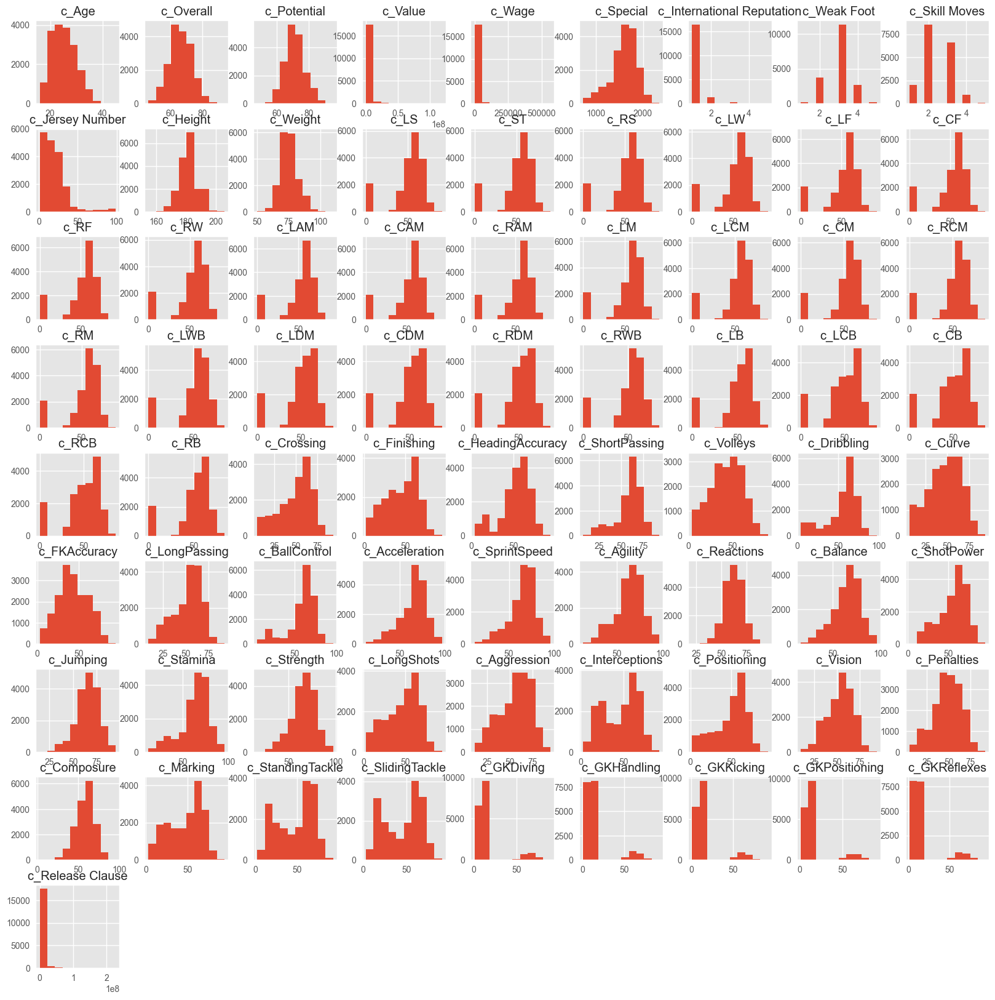

In [51]:
X.hist(figsize=(20,20))

### Missings

In [52]:
X.isnull().sum()

c_Age                          0
c_Overall                      0
c_Potential                    0
c_Value                        0
c_Wage                         0
c_Special                      0
c_International Reputation    48
c_Weak Foot                   48
c_Skill Moves                 48
c_Jersey Number               60
c_Height                      48
c_Weight                      48
c_LS                           0
c_ST                           0
c_RS                           0
c_LW                           0
c_LF                           0
c_CF                           0
c_RF                           0
c_RW                           0
c_LAM                          0
c_CAM                          0
c_RAM                          0
c_LM                           0
c_LCM                          0
c_CM                           0
c_RCM                          0
c_RM                           0
c_LWB                          0
c_LDM                          0
c_CDM     

In [53]:
um_aux = df[um]

In [54]:
im = SimpleImputer(strategy="median")

In [55]:
im.fit(X[varc])

SimpleImputer(strategy='median')

In [56]:
X[varc] = im.transform(X[varc])

In [57]:
#Validating distribution was not altered
ks = pd.DataFrame( map(lambda v:  (v , ks_2samp(df[v].dropna() , X[v]  ).statistic  ) , varc    ) , columns= ['var','ks']    )

In [58]:
#distribution wasnt altered, values are <0.1
ks

,var,ks
0,c_Age,0.000000
1,c_Overall,0.000000
2,c_Potential,0.000000
3,c_Value,0.000000
4,c_Wage,0.000000
5,c_Special,0.000000
6,c_International Reputation,0.000236
7,c_Weak Foot,0.000569
8,c_Skill Moves,0.001099
9,c_Jersey Number,0.001612


### Outliers

In [59]:
ext = X[varc].describe(percentiles=[0.005,0.995]).T[['0.5%','99.5%']].reset_index()
for v, li, ls in ext.values:
    X[f'ol_{v}'] = ( (X[v]<li) | (X[v]>ls)  ).astype(int)
    
X['ext'] = X.filter(like='ol_').max(axis=1)

In [60]:
X.drop(X.filter(like='ol_').columns, axis=1, inplace=True)

In [61]:
#14% of the values are outliers, we're gonna try looking with an IsolatedForest
X['ext'].value_counts(True)

0    0.85198
1    0.14802
Name: ext, dtype: float64

In [62]:
X_aux = X.copy()

In [63]:
max_features=X_aux.shape[1]
n_estimators=50
max_samples='auto'
contamination=float(0.02)
model=IsolationForest(max_features = max_features, n_estimators=n_estimators, max_samples=max_samples, contamination=contamination)
model.fit(X_aux)

/Users/davidrinconmorales/Documents/env/diplo/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.02, max_features=74, n_estimators=50)

In [64]:
X_aux["Outlier"] = model.predict(X_aux)

In [65]:
#Accordint to the IsolationForest, only 2% of our data is outlier, we're gonna go with this route
X_aux["Outlier"].value_counts(True)

 1    0.979953
-1    0.020047
Name: Outlier, dtype: float64

In [66]:
X.drop(columns="ext", inplace = True)

In [67]:
X["Outlier"] = X_aux["Outlier"].copy()

In [68]:
X = X[X["Outlier"] != -1]
X.drop(columns="Outlier", axis = 1, inplace =True)
X.reset_index(drop=True, inplace = True)

array([[<AxesSubplot:title={'center':'c_Age'}>,
        <AxesSubplot:title={'center':'c_Overall'}>,
        <AxesSubplot:title={'center':'c_Potential'}>,
        <AxesSubplot:title={'center':'c_Value'}>,
        <AxesSubplot:title={'center':'c_Wage'}>,
        <AxesSubplot:title={'center':'c_Special'}>,
        <AxesSubplot:title={'center':'c_International Reputation'}>,
        <AxesSubplot:title={'center':'c_Weak Foot'}>,
        <AxesSubplot:title={'center':'c_Skill Moves'}>],
       [<AxesSubplot:title={'center':'c_Jersey Number'}>,
        <AxesSubplot:title={'center':'c_Height'}>,
        <AxesSubplot:title={'center':'c_Weight'}>,
        <AxesSubplot:title={'center':'c_LS'}>,
        <AxesSubplot:title={'center':'c_ST'}>,
        <AxesSubplot:title={'center':'c_RS'}>,
        <AxesSubplot:title={'center':'c_LW'}>,
        <AxesSubplot:title={'center':'c_LF'}>,
        <AxesSubplot:title={'center':'c_CF'}>],
       [<AxesSubplot:title={'center':'c_RF'}>,
        <AxesSubplot:titl

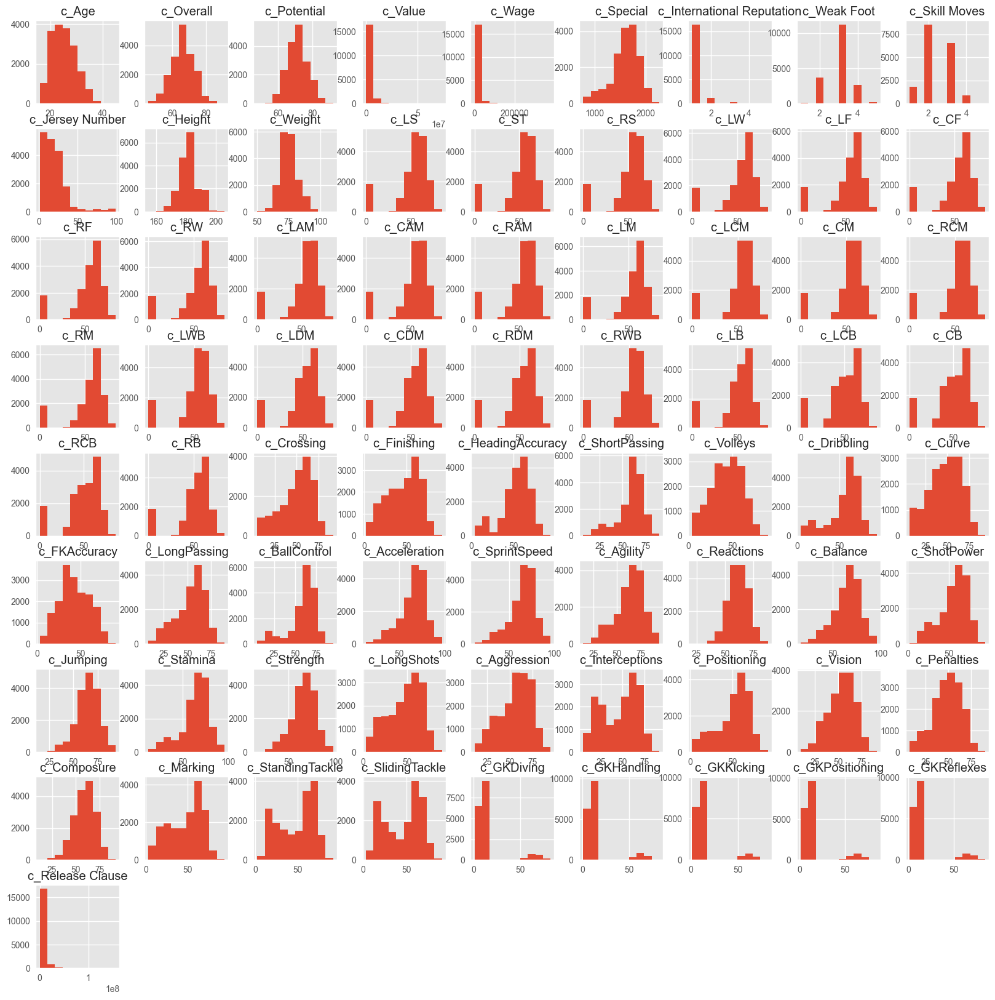

In [69]:
X[varc].hist(figsize=(20,20))

## Bivariate Analysis

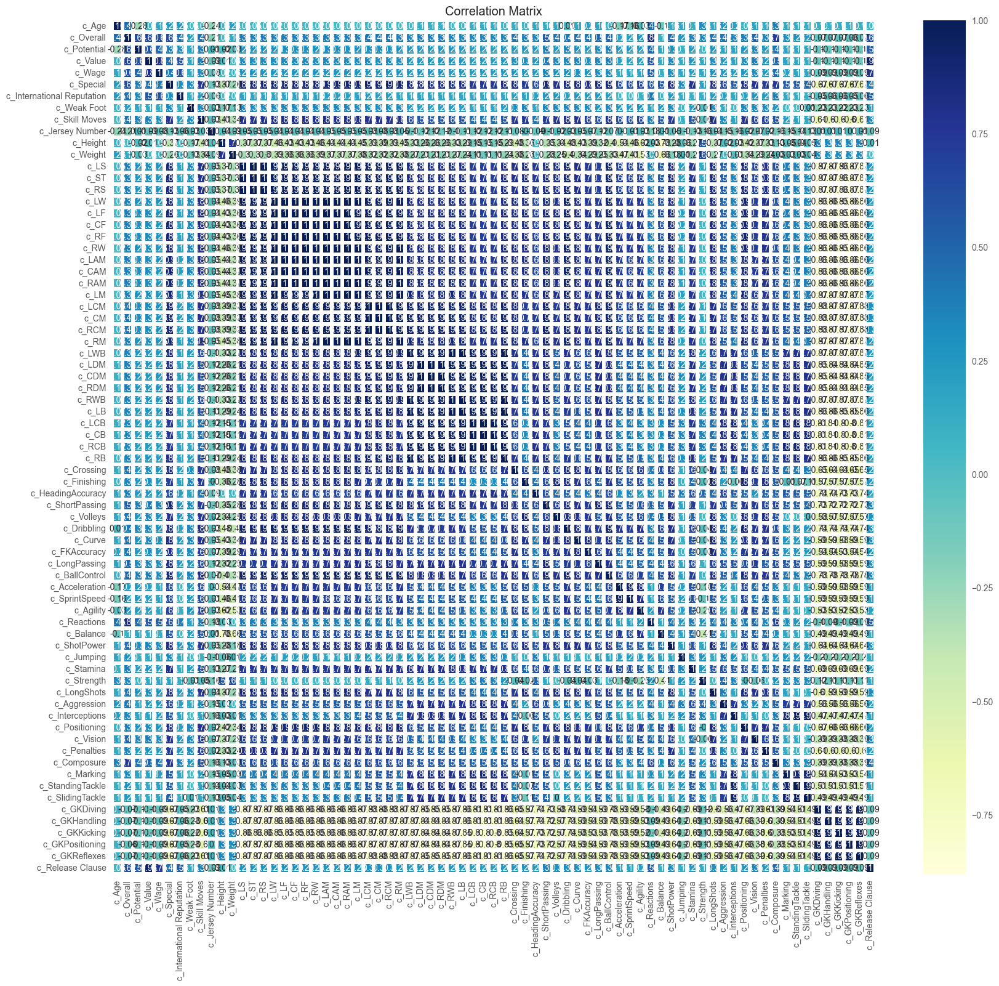

In [70]:
corr_df = X[varc].corr()
plt.figure(figsize=(20,18))
sns.heatmap(round(X[varc].corr(),2),annot=True, cmap='YlGnBu', linewidths=3, fmt='.2g')
plt.title('Correlation Matrix')
plt.show()

### Multicolinealidad

In [71]:
vc = VarClusHi(df=X[varc], feat_list = varc)
vc.varclus()

In [72]:
rs = vc.rsquare
rs = rs.sort_values(by=['Cluster','RS_Ratio'] , ascending=[1,1]).reset_index(drop=True)

In [73]:
#We have multicolinealidad, we need to do Dimensional Scaling
rs['id'] = rs.groupby('Cluster').cumcount()+1
rs

,Cluster,Variable,RS_Own,RS_NC,RS_Ratio,id
0,0,c_LAM,0.996018,0.862271,0.028911,1
1,0,c_CAM,0.996018,0.862271,0.028911,2
2,0,c_RAM,0.996018,0.862271,0.028911,3
3,0,c_LM,0.991360,0.833751,0.051970,4
4,0,c_RM,0.991360,0.833751,0.051970,5
5,0,c_LF,0.988391,0.870887,0.089915,6
6,0,c_CF,0.988391,0.870887,0.089915,7
7,0,c_RF,0.988391,0.870887,0.089915,8
8,0,c_LW,0.986289,0.862607,0.099791,9
9,0,c_RW,0.986289,0.862607,0.099791,10


# Variable Engineering

In [74]:
#We define our new dataframe with the treated data
df = df[um+varn+varc]

df.head()

,ID,v_Nationality,v_Preferred Foot,v_Work Rate,v_Body Type,v_Real Face,v_Position,v_Loaned,c_Age,c_Overall,c_Potential,c_Value,c_Wage,c_Special,c_International Reputation,c_Weak Foot,c_Skill Moves,c_Jersey Number,c_Height,c_Weight,c_LS,c_ST,c_RS,c_LW,c_LF,c_CF,c_RF,c_RW,c_LAM,c_CAM,c_RAM,c_LM,c_LCM,c_CM,c_RCM,c_RM,c_LWB,c_LDM,c_CDM,c_RDM,c_RWB,c_LB,c_LCB,c_CB,c_RCB,c_RB,c_Crossing,c_Finishing,c_HeadingAccuracy,c_ShortPassing,c_Volleys,c_Dribbling,c_Curve,c_FKAccuracy,c_LongPassing,c_BallControl,c_Acceleration,c_SprintSpeed,c_Agility,c_Reactions,c_Balance,c_ShotPower,c_Jumping,c_Stamina,c_Strength,c_LongShots,c_Aggression,c_Interceptions,c_Positioning,c_Vision,c_Penalties,c_Composure,c_Marking,c_StandingTackle,c_SlidingTackle,c_GKDiving,c_GKHandling,c_GKKicking,c_GKPositioning,c_GKReflexes,c_Release Clause
0,158023,Argentina,Left,Medium/ Medium,Normal,Yes,SMALL_CATEGORIES,0,31,94,94,110500000.0,565000.0,2202,5.0,4.0,4.0,10.0,170.18,72.186,88,88,88,92,93,93,93,92,93,93,93,91,84,84,84,91,64,61,61,61,64,59,47,47,47,59,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,226500000.0
1,175943,SMALL_CATEGORIES,Right,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0,31,87,87,45000000.0,135000.0,2043,3.0,4.0,4.0,14.0,170.18,60.836,78,78,78,86,85,85,85,86,86,86,86,85,78,78,78,85,65,60,60,60,65,60,46,46,46,60,77.0,86.0,35.0,82.0,70.0,91.0,82.0,79.0,74.0,89.0,93.0,85.0,94.0,88.0,92.0,80.0,60.0,75.0,42.0,81.0,59.0,36.0,87.0,83.0,79.0,81.0,25.0,40.0,40.0,7.0,10.0,8.0,10.0,4.0,76500000.0
2,150516,Germany,Left,SMALL_CATEGORIES,Normal,Yes,SMALL_CATEGORIES,0,33,78,78,6500000.0,11000.0,2048,3.0,3.0,4.0,10.0,182.88,83.082,77,77,77,76,77,77,77,76,76,76,76,75,71,71,71,75,62,61,61,61,62,59,56,56,56,59,75.0,77.0,66.0,76.0,88.0,78.0,80.0,75.0,67.0,78.0,76.0,75.0,67.0,76.0,70.0,92.0,71.0,70.0,83.0,80.0,70.0,36.0,75.0,79.0,83.0,79.0,54.0,39.0,39.0,10.0,9.0,16.0,9.0,9.0,8100000.0
3,172114,Argentina,Right,High/ Medium,Lean,Yes,SMALL_CATEGORIES,0,32,80,80,11500000.0,12000.0,2009,2.0,3.0,3.0,8.0,177.80,74.910,77,77,77,77,78,78,78,77,79,79,79,77,76,76,76,77,61,60,60,60,61,57,51,51,51,57,78.0,80.0,70.0,79.0,75.0,78.0,80.0,79.0,76.0,82.0,62.0,60.0,72.0,80.0,73.0,85.0,68.0,82.0,63.0,84.0,53.0,36.0,84.0,82.0,79.0,83.0,39.0,40.0,30.0,15.0,15.0,8.0,10.0,12.0,17300000.0
4,157321,SMALL_CATEGORIES,Left,Medium/ Medium,Normal,No,SMALL_CATEGORIES,0,38,66,66,220000.0,2000.0,1711,1.0,3.0,3.0,28.0,172.72,67.192,64,64,64,65,66,66,66,65,66,66,66,64,62,62,62,64,51,52,52,52,51,49,46,46,46,49,59.0,67.0,60.0,65.0,63.0,66.0,68.0,34.0,62.0,70.0,65.0,60.0,72.0,65.0,60.0,68.0,62.0,60.0,59.0,65.0,67.0,38.0,63.0,71.0,68.0,70.0,35.0,31.0,27.0,7.0,16.0,12.0,16.0,10.0,275000.0


In [75]:
df.shape

(18207, 81)

In [76]:
df["c_Value_Relationship"] = df["c_Value"] / df["c_Wage"]

In [77]:
#Body Mass Index (IMC)
df["c_IMC"] = df["c_Weight"] / ((df["c_Height"]/100)**2)

In [78]:
varc = [x for x in df.columns.tolist() if x not in um+varn]

In [79]:
X = df[varc].copy()

## Dummies

In [80]:
df_cat = pd.get_dummies(df[varn])
df_cat

,v_Nationality_Argentina,v_Nationality_England,v_Nationality_France,v_Nationality_Germany,v_Nationality_SMALL_CATEGORIES,v_Nationality_Spain,v_Preferred Foot_Left,v_Preferred Foot_Right,v_Work Rate_High/ High,v_Work Rate_High/ Medium,v_Work Rate_Medium/ High,v_Work Rate_Medium/ Medium,v_Work Rate_SMALL_CATEGORIES,v_Body Type_Lean,v_Body Type_Normal,v_Body Type_Stocky,v_Real Face_No,v_Real Face_Yes,v_Position_CAM,v_Position_CB,v_Position_CDM,v_Position_CM,v_Position_GK,v_Position_LB,v_Position_LM,v_Position_RB,v_Position_RM,v_Position_SMALL_CATEGORIES,v_Position_ST,v_Loaned_0,v_Loaned_1
0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
2,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
3,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
4,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18202,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
18203,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
18204,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
18205,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1


# Scaling Values

In [81]:
Sc = StandardScaler()

df_scaled = pd.DataFrame(Sc.fit_transform(X[varc]), columns=X.columns)
df_scaled.head()

,c_Age,c_Overall,c_Potential,c_Value,c_Wage,c_Special,c_International Reputation,c_Weak Foot,c_Skill Moves,c_Jersey Number,c_Height,c_Weight,c_LS,c_ST,c_RS,c_LW,c_LF,c_CF,c_RF,c_RW,c_LAM,c_CAM,c_RAM,c_LM,c_LCM,c_CM,c_RCM,c_RM,c_LWB,c_LDM,c_CDM,c_RDM,c_RWB,c_LB,c_LCB,c_CB,c_RCB,c_RB,c_Crossing,c_Finishing,c_HeadingAccuracy,c_ShortPassing,c_Volleys,c_Dribbling,c_Curve,c_FKAccuracy,c_LongPassing,c_BallControl,c_Acceleration,c_SprintSpeed,c_Agility,c_Reactions,c_Balance,c_ShotPower,c_Jumping,c_Stamina,c_Strength,c_LongShots,c_Aggression,c_Interceptions,c_Positioning,c_Vision,c_Penalties,c_Composure,c_Marking,c_StandingTackle,c_SlidingTackle,c_GKDiving,c_GKHandling,c_GKKicking,c_GKPositioning,c_GKReflexes,c_Release Clause,c_Value_Relationship,c_IMC
0,1.258678,4.018287,3.698092,19.319674,25.240993,2.216573,9.864420,1.593944,2.167171,-0.598602,-1.646010,-0.447583,1.812370,1.812370,1.812370,1.894783,1.966000,1.966000,1.966000,1.894783,1.950513,1.950513,1.950513,1.822254,1.598541,1.598541,1.598541,1.822254,0.648449,0.522993,0.522993,0.522993,0.648449,0.430953,-0.107692,-0.107692,-0.107692,0.430953,1.865922,2.532567,1.018552,2.130287,2.435355,2.201445,2.491426,2.925736,2.237037,2.255198,1.767621,1.452129,1.862187,3.680643,2.195382,1.713704,0.246247,0.552403,-0.502679,2.434582,-0.453087,-1.193365,2.255244,2.869906,1.684414,3.266205,-0.717531,-0.909268,-0.923569,-0.599961,-0.318908,-0.074659,-0.140241,-0.485161,20.761998,-0.182134,1.429316
1,1.258678,3.005078,2.557344,7.612330,5.694371,1.633254,4.788534,1.593944,2.167171,-0.347776,-1.646010,-2.050876,1.319950,1.319950,1.319950,1.608585,1.582436,1.582436,1.582436,1.608585,1.615631,1.615631,1.615631,1.535329,1.302938,1.302938,1.302938,1.535329,0.698051,0.474034,0.474034,0.474034,0.698051,0.480496,-0.155644,-0.155644,-0.155644,0.480496,1.484741,2.071626,-0.995323,1.586036,1.531089,1.884150,1.893429,2.067529,1.388885,1.835688,1.901603,1.383867,2.065362,2.903747,1.983154,1.423639,-0.430588,0.741149,-1.856543,1.759607,0.180280,-0.516916,1.896793,2.092328,1.939132,1.954537,-1.119463,-0.355338,-0.265938,-0.543447,-0.378057,-0.498840,-0.375063,-0.707945,6.753107,-0.000131,-1.350587
2,1.686961,1.702380,1.090669,0.730914,0.057671,1.651598,4.788534,0.079797,2.167171,-0.598602,0.241074,1.091577,1.270708,1.270708,1.270708,1.131587,1.198873,1.198873,1.198873,1.131587,1.137229,1.137229,1.137229,1.057121,0.958068,0.958068,0.958068,1.057121,0.549244,0.522993,0.522993,0.522993,0.549244,0.430953,0.323875,0.323875,0.323875,0.430953,1.375833,1.610685,0.788395,1.177848,2.548388,1.196678,1.784703,1.838673,0.932188,1.176458,0.762755,0.701252,0.236792,1.571926,0.426820,2.119796,0.500060,0.426571,1.408658,1.707686,0.813647,-0.516916,1.282307,1.809572,2.193851,1.779648,0.337542,-0.401499,-0.312912,-0.373906,-0.437206,-0.014062,-0.433768,-0.429465,0.365053,0.340172,1.369921
3,1.472820,1.991868,1.416597,1.624605,0.103128,1.508520,2.250592,0.079797,0.844670,-0.724015,-0.513760,-0.062793,1.270708,1.270708,1.270708,1.179287,1.246818,1.246818,1.246818,1.179287,1.280750,1.280750,1.280750,1.152763,1.204404,1.204404,1.204404,1.152763,0.499642,0.474034,0.474034,0.474034,0.499642,0.331866,0.084115,0.084115,0.084115,0.331866,1.539196,1.764332,1.018552,1.381942,1.813672,1.196678,1.784703,2.067529,1.519370,1.416178,-0.175120,-0.322670,0.575416,2.015866,0.639047,1.713704,0.246247,1.181559,-0.184123,1.915371,-0.165193,-0.516916,1.743172,2.021639,1.939132,2.129426,-0.416082,-0.355338,-0.735674,-0.091339,-0.082312,-0.498840,-0.375063,-0.262377,1.224265,0.825604,0.557561
4,2.757667,-0.034550,-0.864898,-0.391561,-0.351444,0.415257,-0.287351,0.079797,0.844670,0.530114,-1.268593,-1.153032,0.630561,0.630561,0.630561,0.606890,0.671473,0.671473,0.671473,0.606890,0.658827,0.658827,0.658827,0.531093,0.514663,0.514663,0.514663,0.531093,0.003618,0.082362,0.082362,0.082362,0.003618,-0.064479,-0.155644,-0.155644,-0.155644,-0.064479,0.504564,1.098529,0.443159,0.429502,1.135473,0.562088,1.132343,-0.507095,0.605976,0.697018,0.025853,-0.322670,0.5754

In [82]:
df_scaled.shape

(18207, 75)

## PCA

In [83]:
df_scaled = df_scaled.dropna()

In [84]:
#With 10 components it explains 90% of our data
for n_compo in range(1,74):
    print(f"N componentes : {n_compo}")
    pca = PCA(n_components=n_compo)
    pca.fit(df_scaled)
    print(sum(pca.explained_variance_ratio_))
    print("\n")

N componentes : 1
0.5927210802640257


N componentes : 2
0.6929473555659128


N componentes : 3
0.7701601372389737


N componentes : 4
0.8058278968770106


N componentes : 5
0.8318684621058378


N componentes : 6
0.8511876862511986


N componentes : 7
0.8676234897539175


N componentes : 8
0.8817237182965411


N componentes : 9
0.8939257408755817


N componentes : 10
0.9052644119257469


N componentes : 11
0.916513724449426


N componentes : 12
0.9252026270823545


N componentes : 13
0.9320772198833905


N componentes : 14
0.9380507217208892


N componentes : 15
0.9433696905041462


N componentes : 16
0.9479098372096239


N componentes : 17
0.9517996573006943


N componentes : 18
0.9553468209163963


N componentes : 19
0.9586230333212361


N componentes : 20
0.9619109951868329


N componentes : 21
0.9647992168147439


N componentes : 22
0.9676109270532921


N componentes : 23
0.9703842929895733


N componentes : 24
0.9729897538026072


N componentes : 25
0.9754562168913574


N componen

In [85]:
pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_scaled)

In [86]:
df_pca = pd.DataFrame(df_pca, columns=["PC1","PC2","PC3","PC4","PC5","PC6","PC7", "PC8", "PC9", "PC10"])
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-14.101739,9.983959,26.470660,11.442920,16.291821,0.955328,-13.777950,4.318678,-3.335468,4.162074
1,-10.188057,7.242346,9.080452,5.640301,3.704895,1.144931,-3.585747,-0.207580,-0.957105,1.545809
2,-7.684690,2.836516,4.639621,-2.652051,-0.751309,0.068973,-0.697665,0.451785,0.230319,0.157323
3,-7.618322,3.826342,4.272205,-1.229484,-1.101958,1.077021,0.107637,-0.186314,-0.102968,0.312804
4,-2.961430,2.642460,-0.253931,-1.528355,-2.087262,1.011776,-1.063798,-0.894368,0.936801,0.535914
...,...,...,...,...,...,...,...,...,...,...
17913,-6.409865,3.760253,2.979507,-1.821834,-0.171183,1.863233,0.813416,0.156206,-0.357547,-1.506555
17914,-2.602194,3.409310,-0.882252,-1.171500,-0.443792,-0.578059,-0.631012,-0.197310,0.026244,-0.211554
17915,-0.615416,4.108079,-2.012444,-0.125516,1.639614,0.718255,0.804766,0.228528,-0.204361,-0.797395
17916,-4.167772,2.262991,2.045284,-3.817547,-0.011512,0.555943,0.399352,1.044606,1.087641,-0.675126


In [87]:
df_new = pd.concat([df_pca, df_cat], axis = 1)

# Clustering

In [88]:
df_new.dropna(inplace=True)

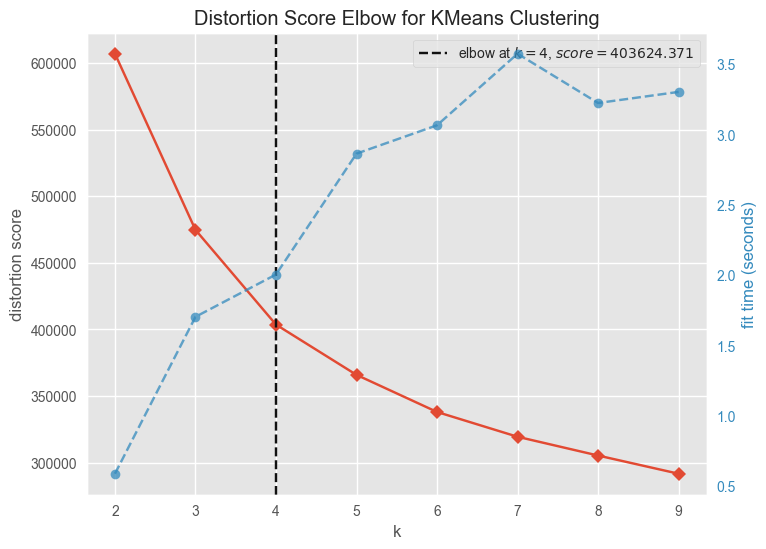

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [89]:
elbow(df_new,2,10)

In [90]:
score_silueta(df_new,2,10)

In [91]:
score_calinski(df_new,2,10)

In [92]:
KM_4 = KMeans(n_clusters = 4, n_init = 100, init='k-means++', random_state = 0).fit(df_new)
KM_3 = KMeans(n_clusters = 3, n_init = 100, init='k-means++', random_state = 0).fit(df_new)

In [93]:
df.dropna(inplace = True)

In [94]:
df['cluster_4'] = KM_4.labels_
df['cluster_3'] = KM_3.labels_

# Visualizations

## 3 clusters

In [95]:
pca_3 = PCA(n_components=2)

df_pca_3 = pd.DataFrame(pca_3.fit_transform(df_scaled))
df_pca_3.columns = ["P1", "P2"]
df_pca_3["Labels"] = KM_3.labels_

fig = fig = px.scatter(df_pca_3, x="P1", y="P2", color="Labels")
fig.show()

## 4 Clusters

In [96]:
pca_4 = PCA(n_components=2)

df_pca_4 = pd.DataFrame(pca_4.fit_transform(df_scaled))
df_pca_4.columns = ["P1", "P2"]
df_pca_4["Labels"] = KM_4.labels_

fig = fig = px.scatter(df_pca_4, x="P1", y="P2", color="Labels")
fig.show()

# Profiling

## 3 Clusters

In [97]:
df.drop(columns=["ID","cluster_4"]).groupby(["cluster_3"]).mean().style.background_gradient() 

,c_Age,c_Overall,c_Potential,c_Value,c_Wage,c_Special,c_International Reputation,c_Weak Foot,c_Skill Moves,c_Jersey Number,c_Height,c_Weight,c_LS,c_ST,c_RS,c_LW,c_LF,c_CF,c_RF,c_RW,c_LAM,c_CAM,c_RAM,c_LM,c_LCM,c_CM,c_RCM,c_RM,c_LWB,c_LDM,c_CDM,c_RDM,c_RWB,c_LB,c_LCB,c_CB,c_RCB,c_RB,c_Crossing,c_Finishing,c_HeadingAccuracy,c_ShortPassing,c_Volleys,c_Dribbling,c_Curve,c_FKAccuracy,c_LongPassing,c_BallControl,c_Acceleration,c_SprintSpeed,c_Agility,c_Reactions,c_Balance,c_ShotPower,c_Jumping,c_Stamina,c_Strength,c_LongShots,c_Aggression,c_Interceptions,c_Positioning,c_Vision,c_Penalties,c_Composure,c_Marking,c_StandingTackle,c_SlidingTackle,c_GKDiving,c_GKHandling,c_GKKicking,c_GKPositioning,c_GKReflexes,c_Release Clause,c_Value_Relationship,c_IMC
cluster_3,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,23.512435,62.147008,69.239966,676628.909136,3418.862349,1517.697119,1.013667,2.844743,2.152918,21.435115,181.747914,75.148906,51.375646,51.375646,51.375646,51.873307,51.540754,51.540754,51.540754,51.873307,51.744644,51.744644,51.744644,52.898917,51.778872,51.778872,51.778872,52.898917,53.546663,53.154642,53.154642,53.154642,53.546663,53.624354,53.967003,53.967003,53.967003,53.624354,45.732948,40.930190,55.979315,56.532135,38.098744,52.621522,41.282935,37.275548,49.446319,56.377493,64.085939,64.599975,60.774194,56.934745,62.690470,51.587663,64.836863,63.065132,65.775548,41.173972,56.666215,48.739842,45.913814,46.872568,45.902241,54.108963,50.558483,51.532751,49.788106,10.380941,10.430805,10.413691,10.414676,10.396700,1150705.491258,244.839371,22.722733
1,26.530241,70.920554,73.895054,4506365.325474,17369.425935,1822.845079,1.222578,3.169913,2.929267,17.525500,178.972358,73.852548,64.530882,64.530882,64.530882,66.511148,66.211686,66.211686,66.211686,66.511148,66.539723,66.539723,66.539723,66.859303,64.931445,64.931445,64.931445,66.859303,61.606612,60.616222,60.616222,60.616222,61.606612,60.075474,57.285879,57.285879,57.285879,60.075474,62.990646,58.993080,58.144285,69.008842,55.762814,68.929267,61.691440,55.977704,63.005894,70.345592,71.861738,71.496540,72.331497,67.656586,70.627755,67.964762,67.299974,71.717581,66.054331,62.136853,62.603152,52.130190,64.138903,64.468221,58.587519,66.838288,52.018068,52.247565,49.390185,10.621732,10.683239,10.687468,10.647488,10.624167,7850809.712968,446.336721,23.039375
2,26.017068,64.562751,69.796687,1612085.843373,6916.666667,1045.555723,1.096888,2.492972,1.000000,20.632028,188.206094,82.035202,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.245984,12.001004,14.359940,27.273092,12.372992,13.826305,14.695281,14.436747,25.809739,19.947791,38.260542,38.667169,40.225402,58.877510,43.035643,22.533635,57.702309,30.434739,60.618976,12.625502,26.326807,17.027108,11.230924,37.092871,19.972390,45.133534,15.207329,14.112952,14.063755,65.291165,62.843876,61.439759,62.983434,66.056727,2859147.088353,253.908941,23.155345


With 3 cluster we have the following profiles:

- Cluster 0: Average Player
- Cluster 1: Premium Players (Superstars)
- Cluster 2: Undervalued Player (Goalkeppers)

**Superstars**:
- These are the players with the largest value from all of them with 4.5M+
- They have a monthly wage of almost 2.5x bigger than the undervalued player (17.3K vs ~7K)
- On average, they are the oldest players on the league but not by much.
- Their international reputation is, on average, 10% better than the undervalued player
- They are the shortest players in the ciruit with ~1.79m on average (vs 1.82 and 1.88m)
- Their Release Closure is almost 3x bigger than the undervalued player

**Average Players**:
- They are the youngest players by almost a 3 year difference.
- Their average mass body index (IMC) is the lowest with ~22.72 (vs 23.03 from the premium and 23.15 from the avg player)
- Their Release Closure the smallest and half as much as the undervalued player amount

**Undervalued Players**:
- Their value is less than half of the Superstar player.
- On average, they almost have the same age as the superstar player
- We can say that their IMC is pretty much the same as the superstar player
- They almost have the same value_relationship as the average player (player value / monthly wage)

## 4 Clusters

In [98]:
df.drop(columns=["ID","cluster_3"]).groupby(["cluster_4"]).mean().style.background_gradient() 

,c_Age,c_Overall,c_Potential,c_Value,c_Wage,c_Special,c_International Reputation,c_Weak Foot,c_Skill Moves,c_Jersey Number,c_Height,c_Weight,c_LS,c_ST,c_RS,c_LW,c_LF,c_CF,c_RF,c_RW,c_LAM,c_CAM,c_RAM,c_LM,c_LCM,c_CM,c_RCM,c_RM,c_LWB,c_LDM,c_CDM,c_RDM,c_RWB,c_LB,c_LCB,c_CB,c_RCB,c_RB,c_Crossing,c_Finishing,c_HeadingAccuracy,c_ShortPassing,c_Volleys,c_Dribbling,c_Curve,c_FKAccuracy,c_LongPassing,c_BallControl,c_Acceleration,c_SprintSpeed,c_Agility,c_Reactions,c_Balance,c_ShotPower,c_Jumping,c_Stamina,c_Strength,c_LongShots,c_Aggression,c_Interceptions,c_Positioning,c_Vision,c_Penalties,c_Composure,c_Marking,c_StandingTackle,c_SlidingTackle,c_GKDiving,c_GKHandling,c_GKKicking,c_GKPositioning,c_GKReflexes,c_Release Clause,c_Value_Relationship,c_IMC
cluster_4,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,23.397804,63.285687,70.192063,877012.136390,4167.597765,1588.149490,1.010981,3.056636,2.598536,23.285301,178.619592,72.474003,59.839145,59.839145,59.839145,60.879985,60.732807,60.732807,60.732807,60.879985,60.070314,60.070314,60.070314,60.215758,55.115777,55.115777,55.115777,60.215758,48.954344,46.408207,46.408207,46.408207,48.954344,46.890195,42.581584,42.581584,42.581584,46.890195,51.732036,59.364862,52.081680,59.301869,52.034097,63.450395,52.192641,45.848006,50.278944,63.164708,71.752071,71.589674,70.098054,58.022732,69.534579,61.597958,62.361009,62.120593,59.570410,55.128299,47.536698,30.018108,59.940089,56.127721,56.710653,57.142747,33.839337,31.172414,29.489501,10.372568,10.487382,10.500289,10.404354,10.428819,1399502.408014,277.589643,22.693295
1,26.988143,72.463377,74.978772,5934606.043221,22449.607956,1882.056990,1.315165,3.174412,2.975139,16.834194,179.309233,74.245714,65.347103,65.347103,65.347103,67.514247,67.231211,67.231211,67.231211,67.514247,67.864028,67.864028,67.864028,68.187416,67.454771,67.454771,67.454771,68.187416,65.306177,64.920061,64.920061,64.920061,65.306177,64.066169,61.988143,61.988143,61.988143,64.066169,65.424173,58.288965,59.656340,71.363167,56.063875,69.890228,63.688277,58.219927,66.361637,71.875120,71.061771,70.619239,71.987187,69.804934,70.527634,69.356282,68.218589,74.066552,67.725186,63.604513,66.947600,59.414420,64.800918,66.564161,58.876458,68.946452,58.181488,59.683113,56.520750,10.635877,10.669344,10.707019,10.649646,10.602601,10450917.575062,490.762770,23.078412
2,26.017068,64.562751,69.796687,1612085.843373,6916.666667,1045.555723,1.096888,2.492972,1.000000,20.632028,188.206094,82.035202,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.245984,12.001004,14.359940,27.273092,12.372992,13.826305,14.695281,14.436747,25.809739,19.947791,38.260542,38.667169,40.225402,58.877510,43.035643,22.533635,57.702309,30.434739,60.618976,12.625502,26.326807,17.027108,11.230924,37.092871,19.972390,45.133534,15.207329,14.112952,14.063755,65.291165,62.843876,61.439759,62.983434,66.056727,2859147.088353,253.908941,23.155345
3,24.596985,63.711406,69.490193,922381.038867,4412.640756,1537.751362,1.025972,2.792772,2.052307,18.518888,183.079288,76.691121,48.773520,48.773520,48.773520,49.274973,48.767526,48.767526,48.767526,49.274973,49.556847,49.556847,49.556847,51.268253,52.387577,52.387577,52.387577,51.268253,58.132219,58.917363,58.917363,58.917363,58.132219,59.200327,61.787505,61.787505,61.787505,59.200327,45.836905,32.666364,59.230476,57.519978,32.935707,49.126226,38.645478,35.810570,51.815837,55.058482,61.254631,62.068652,57.715765,58.883037,60.045042,48.487650,67.450599,65.771340,70.169270,36.427897,63.924083,61.058300,40.584635,44.385398,41.370323,55.199782,61.150381,64.001090,61.967490,10.488013,10.508718,10.441518,10.531239,10.493280,1580291.318562,266.006317,22.861499


With 4 cluster we have the following profiles as we include a cluster for the entry level players:

- Cluster 0: Entry Level Player
- Cluster 1: Premium Players (Superstars)
- Cluster 2: Undervalued Player (Goalkeppers)
- Cluster 3: Average Player

**Superstars**:
- With this clustering, the superstar players value increase to almost 6M, this is almost 4x than the nearest cluster (undervalued players)
- Their wage is 3x as much as the undervalued player (nearest monthly wage)
- They have the biggest international reputation with 1.31 pts vs 1.09 pts forom the nearest cluster
- Their Release Closure is over 10M, this represents an increase of almost 4x to the nearest cluster

**Undervalued Players (Goalkeppers)**:
- They have 1/3 of the value of the supoerstar player
- They are the tallest players in the circuit with 1.88m on height vs 1.83m of the nearest cluster (average players)
- They are the heaviest players by almost 6 kg (their IMC is the biggest of the bunch)
- Their Release Closure is 2x as much as the entry level player
- They have the best value/wage relationship

**Average Players**:
- They have almost the same overall score than the entry level player.
- Their wage is 10% bigger than the entry level but 2.5K lower than the undervalued player

**Entry Level Players**:
- They are the youngest players by almost a 1.5 year difference.
- Their average mass body index (IMC) is the lowest with ~22.69
- Their Release Closure the smallest just by 200k